In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
orig_path = 'DeepFake Data/Original/'
manip_path = 'DeepFake Data/Manipulated/'
all_videos_path = 'DeepFake Data/All/'

In [3]:
import cv2

def downsample_video_data(path, filename, new_path):
    cap = cv2.VideoCapture(path)

    print("Input:", path)

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)

    out_width = int(width * 0.2)
    out_height = int(height * 0.2)

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    output_path = new_path + filename[:-4] + '_downsampled.mp4'
    print(output_path)
    out = cv2.VideoWriter(output_path, fourcc, fps, (out_width, out_height))

    # Loop through the frames of the input video
    while cap.isOpened():
    # Read a frame from the video
        ret, frame = cap.read()
        if not ret:
            break
    
    # Downsample the frame
        downsampled = cv2.resize(frame, (out_width, out_height), interpolation=cv2.INTER_AREA)
    
    # Write the downsampled frame to the output video
        out.write(downsampled)

# Release the video capture and writer objects
    cap.release()
    out.release()


In [4]:
orig_downsampled_path = 'DeepFake Data/orig_downsampled/'
manip_downsampled_path = 'DeepFake Data/manip_downsampled/'

# import os
# for dirname, _, filenames in os.walk(orig_path):
#     for filename in filenames:
#         downsample_video_data(orig_path + filename, filename, orig_downsampled_path)

In [5]:
def add_to_class(path):
    files = []
    files_path = []
    for dirname, _, filenames in os.walk(path):
        for filename in filenames:
            if filename.endswith('.mp4'):
                files.append(filename)
                files_path.append(path + filename)

    return files, files_path

In [6]:
original = add_to_class(orig_downsampled_path)[0]
manipulated = add_to_class(manip_downsampled_path)[0]

In [7]:
original_vid_w_path = add_to_class(orig_path)[1]
manipulated_vid_w_path = add_to_class(manip_path)[1]

In [8]:
print("Number of observations (original videos):", len(original))
print("Number of observations (manipulated videos):", len(manipulated))

Number of observations (original videos): 363
Number of observations (manipulated videos): 353


In [9]:
manipulated

['01_02__walking_down_indoor_hall_disgust__YVGY8LOK_downsampled.mp4',
 '05_16__hugging_happy__053HPS1G_downsampled.mp4',
 '01_15__podium_speech_happy__02HILKYO_downsampled.mp4',
 '02_18__walk_down_hall_angry__B95S4G6F_downsampled.mp4',
 '23_22__walking_and_outside_surprised__J671JKCH_downsampled.mp4',
 '02_01__talking_against_wall__YVGY8LOK_downsampled.mp4',
 '02_06__walking_down_street_outside_angry__MKZTXQ2T_downsampled.mp4',
 '01_14__outside_talking_still_laughing__01YF7VQM_downsampled.mp4',
 '02_06__exit_phone_room__3J3BHSHI_downsampled.mp4',
 '02_03__walking_down_street_outside_angry__QH3Y0IG0_downsampled.mp4',
 '23_19__secret_conversation__H4SUVFTL_downsampled.mp4',
 '02_09__podium_speech_happy__9TDCEK1Q_downsampled.mp4',
 '10_22__podium_speech_happy__EHARPYBT_downsampled.mp4',
 '10_22__kitchen_pan__EHARPYBT_downsampled.mp4',
 '02_15__talking_against_wall__HTG660F8_downsampled.mp4',
 '19_23__secret_conversation__D1K19NUP_downsampled.mp4',
 '01_09__kitchen_pan__6TSGVLHA_downsample

In [10]:
all_videos = original + manipulated

In [11]:
len(original)

363

In [12]:
original[1][:2]

'01'

In [13]:
def get_metadata_dict():
    metadata_dict = {'File name': [],
                    'File path': [],
                    'Label': [],
                    'Original video': []}
    
    return metadata_dict
            

In [14]:
def add_originals(metadata_dict):
    for file_name in original:
        metadata_dict['File name'].append(file_name)
        # metadata_dict['File path'].append(orig_path + file_name)
        metadata_dict['File path'].append(orig_downsampled_path + file_name)
        metadata_dict['Label'].append("original")
        metadata_dict['Original video'].append(None)

In [15]:
def add_manipulated(metadata_dict, manip_video_list = manipulated):
    for manip_file_name in manip_video_list:
        metadata_dict['File name'].append(manip_file_name)
        # metadata_dict['File path'].append(manip_path + manip_file_name)
        metadata_dict['File path'].append(manip_downsampled_path + manip_file_name)
        metadata_dict['Label'].append("manipulated")
        for orig_file_name in original:
            # Check for name of respective original video (conditions based on assumed general naming conventions of file)
            #if (orig_file_name[4:][:-4] in manip_file_name) and (orig_file_name[:2] == manip_file_name[:2]):
            if (orig_file_name[4:][:-16] in manip_file_name) and (orig_file_name[:2] == manip_file_name[:2]):
                print(orig_file_name, '-', manip_file_name)
                metadata_dict['Original video'].append(orig_file_name)

In [16]:
full_metadata_dict = get_metadata_dict()

add_originals(full_metadata_dict)
add_manipulated(full_metadata_dict)

01__walking_down_indoor_hall_disgust_downsampled.mp4 - 01_02__walking_down_indoor_hall_disgust__YVGY8LOK_downsampled.mp4
05__hugging_happy_downsampled.mp4 - 05_16__hugging_happy__053HPS1G_downsampled.mp4
01__podium_speech_happy_downsampled.mp4 - 01_15__podium_speech_happy__02HILKYO_downsampled.mp4
02__walk_down_hall_angry_downsampled.mp4 - 02_18__walk_down_hall_angry__B95S4G6F_downsampled.mp4
23__walking_and_outside_surprised_downsampled.mp4 - 23_22__walking_and_outside_surprised__J671JKCH_downsampled.mp4
02__talking_against_wall_downsampled.mp4 - 02_01__talking_against_wall__YVGY8LOK_downsampled.mp4
02__walking_down_street_outside_angry_downsampled.mp4 - 02_06__walking_down_street_outside_angry__MKZTXQ2T_downsampled.mp4
01__outside_talking_still_laughing_downsampled.mp4 - 01_14__outside_talking_still_laughing__01YF7VQM_downsampled.mp4
02__exit_phone_room_downsampled.mp4 - 02_06__exit_phone_room__3J3BHSHI_downsampled.mp4
02__walking_down_street_outside_angry_downsampled.mp4 - 02_03__wa

In [17]:
len(all_videos)

716

In [18]:
len(full_metadata_dict['Original video'])

716

In [19]:
# Sanity check

assert(len(full_metadata_dict['Original video']) == len(all_videos))

In [20]:
full_metadata_df = pd.DataFrame(full_metadata_dict)
full_metadata_df

,File name,File path,Label,Original video
0,12__kitchen_still_downsampled.mp4,DeepFake Data/orig_downsampled/12__kitchen_sti...,original,None
1,01__walking_and_outside_surprised_downsampled.mp4,DeepFake Data/orig_downsampled/01__walking_and...,original,None
2,22__podium_speech_happy_downsampled.mp4,DeepFake Data/orig_downsampled/22__podium_spee...,original,None
3,22__kitchen_pan_downsampled.mp4,DeepFake Data/orig_downsampled/22__kitchen_pan...,original,None
4,09__talking_against_wall_downsampled.mp4,DeepFake Data/orig_downsampled/09__talking_aga...,original,None
...,...,...,...,...
711,02_07__hugging_happy__1JCLEEBQ_downsampled.mp4,DeepFake Data/manip_downsampled/02_07__hugging...,manipulated,02__hugging_happy_downsampled.mp4
712,05_16__exit_phone_room__B62WCGUN_downsampled.mp4,DeepFake Data/manip_downsampled/05_16__exit_ph...,manipulated,05__exit_phone_room_downsampled.mp4
713,01_09__walk_down_hall_angry__P70H1JB0_downsamp...,DeepFake Data/manip_downsampled/01_09__walk_do...,manipulated,01__walk_down_hall_angry_downsampled.mp4
714,03_12__walk_down_hall_angry__D7G6YJON_downsamp...,DeepFake Data/manip_downsampled/03_12__walk_do...,manipulated,03__walk_down_hall_angry_downsampled.mp4


In [21]:
full_metadata_df.sample(frac=1)

,File name,File path,Label,Original video
320,27__podium_speech_happy_downsampled.mp4,DeepFake Data/orig_downsampled/27__podium_spee...,original,None
260,21__walking_outside_cafe_disgusted_downsampled...,DeepFake Data/orig_downsampled/21__walking_out...,original,None
44,06__talking_angry_couch_downsampled.mp4,DeepFake Data/orig_downsampled/06__talking_ang...,original,None
219,16__kitchen_still_downsampled.mp4,DeepFake Data/orig_downsampled/16__kitchen_sti...,original,None
90,12__walk_down_hall_angry_downsampled.mp4,DeepFake Data/orig_downsampled/12__walk_down_h...,original,None
...,...,...,...,...
199,01__kitchen_pan_downsampled.mp4,DeepFake Data/orig_downsampled/01__kitchen_pan...,original,None
469,05_17__kitchen_pan__M3H96PDQ_downsampled.mp4,DeepFake Data/manip_downsampled/05_17__kitchen...,manipulated,05__kitchen_pan_downsampled.mp4
173,11__walking_down_street_outside_angry_downsamp...,DeepFake Data/orig_downsampled/11__walking_dow...,original,None
92,13__walking_down_indoor_hall_disgust_downsampl...,DeepFake Data/orig_downsampled/13__walking_dow...,original,None


In [22]:
orig_video_name = []
for orig_file_name in original:
    orig_video_name.append(orig_file_name[:][:-4])

orig_video_name

['12__kitchen_still_downsampled',
 '01__walking_and_outside_surprised_downsampled',
 '22__podium_speech_happy_downsampled',
 '22__kitchen_pan_downsampled',
 '09__talking_against_wall_downsampled',
 '24__outside_talking_pan_laughing_downsampled',
 '01__kitchen_still_downsampled',
 '17__outside_talking_still_laughing_downsampled',
 '25__podium_speech_happy_downsampled',
 '08__talking_against_wall_downsampled',
 '14__walking_outside_cafe_disgusted_downsampled',
 '26__exit_phone_room_downsampled',
 '07__kitchen_still_downsampled',
 '07__outside_talking_pan_laughing_downsampled',
 '14__kitchen_still_downsampled',
 '11__exit_phone_room_downsampled',
 '02__podium_speech_happy_downsampled',
 '15__podium_speech_happy_downsampled',
 '13__kitchen_pan_downsampled',
 '06__kitchen_pan_downsampled',
 '14__walking_and_outside_surprised_downsampled',
 '08__kitchen_pan_downsampled',
 '10__walking_outside_cafe_disgusted_downsampled',
 '05__podium_speech_happy_downsampled',
 '06__walking_down_street_outsi

In [23]:
# manipulated_truncated = []

# for name in orig_video_name:
#     manip_counter = 0
#     for manipulated_video in manipulated:
#         if (name in manipulated_video) and (manip_counter < 1):
#             manipulated_truncated.append(manipulated_video)
#             manip_counter += 1

# manipulated_truncated

In [24]:
# for video in manipulated_truncated:
#     if os.path.exists(manip_path + video):
#         downsample_video_data(manip_path + video, video, manip_downsampled_path)

In [25]:
# trunc_metadata_dict = get_metadata_dict()

# add_originals(trunc_metadata_dict)
# add_manipulated(trunc_metadata_dict, manip_video_list=manipulated_truncated)

In [26]:
# trunc_metadata_df = pd.DataFrame(trunc_metadata_dict)
# trunc_metadata_df

In [27]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(full_metadata_df, test_size = 0.2, random_state = 1)

In [28]:
sum(train['Label'] == 'original')

288

In [29]:
train_files = list(train['File name'])
test_files = list(test['File name'])

train_classes = list(train['Label'])
test_classes = list(test['Label'])

In [30]:
train_files_path = list(train['File path'])
test_files_path = list(test['File path'])

In [31]:
assert(len(train_files_path) == len(train_files))
assert(len(test_files_path) == len(test_files))

In [32]:
def format_frames(frame, output_size):
    frame = tf.image.convert_image_dtype(frame, tf.float32)
    frame = tf.image.resize_with_pad(frame, *output_size)
    return frame

In [33]:
import cv2
import random

def frames_from_video_file(video_path, n_frames, output_size = (224, 224), frame_step = 15):
  """
    Creates frames from each video file present for each category.

    Args:
      video_path: File path to the video.
      n_frames: Number of frames to be created per video file.
      output_size: Pixel size of the output frame image.

    Return:
      An NumPy array of frames in the shape of (n_frames, height, width, channels).
  """
  # Read each video frame by frame
  result = []
  src = cv2.VideoCapture(str(video_path))  

  video_length = src.get(cv2.CAP_PROP_FRAME_COUNT)

  need_length = 1 + (n_frames - 1) * frame_step

  if need_length > video_length:
    start = 0
  else:
    max_start = video_length - need_length
    start = random.randint(0, max_start + 1)

  src.set(cv2.CAP_PROP_POS_FRAMES, start)
  # ret is a boolean indicating whether read was successful, frame is the image itself
  ret, frame = src.read()
  result.append(format_frames(frame, output_size))

  for _ in range(n_frames - 1):
    for _ in range(frame_step):
      ret, frame = src.read()
    if ret:
      frame = format_frames(frame, output_size)
      result.append(frame)
    else:
      result.append(np.zeros_like(result[0]))
  src.release()
  result = np.array(result)[..., [2, 1, 0]]

  return result

In [34]:
import imageio
from tensorflow_docs.vis import embed

gifs_generated = 0

def to_gif(images):
    converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
    global gifs_generated
    gifs_generated += 1
    path = str('./sample_' + str(gifs_generated) + '.gif') 
    imageio.mimsave(path, converted_images, fps = 5)

    return embed.embed_file(path)


## Visualizing original videos

DeepFake Data/Original/13__kitchen_pan.mp4
Metal device set to: Apple M1 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB




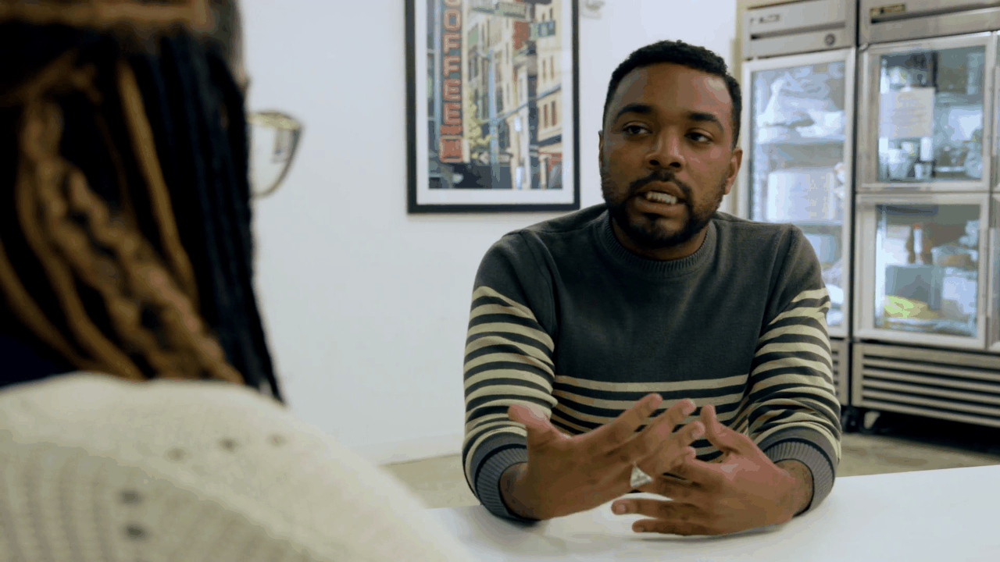

In [35]:
import random
import tensorflow as tf


random_orig_video = original_vid_w_path[random.randint(0, len(original))]

print(random_orig_video)

random_orig_videos_frames = frames_from_video_file(random_orig_video, output_size = (720, 1280), n_frames = 10)

to_gif(random_orig_videos_frames)

## Visualizing altered videos

DeepFake Data/Manipulated/01_02__outside_talking_still_laughing__YVGY8LOK.mp4
[[[[0.03946079 0.03946079 0.05882353]
   [0.05122549 0.05122549 0.06838236]
   [0.06078432 0.06078432 0.08039216]
   ...
   [0.32058823 0.327451   0.35882354]
   [0.32058823 0.327451   0.35882354]
   [0.32058823 0.327451   0.35882354]]

  [[0.04607844 0.04607844 0.06470589]
   [0.05563726 0.05563726 0.07205883]
   [0.06078432 0.06078432 0.08039216]
   ...
   [0.39705884 0.4009804  0.43235296]
   [0.39705884 0.4009804  0.43235296]
   [0.39705884 0.4009804  0.43235296]]

  [[0.14191177 0.14191177 0.15857844]
   [0.14338237 0.14338237 0.16004902]
   [0.14313728 0.14313728 0.15980393]
   ...
   [0.41151965 0.4191177  0.45049024]
   [0.41225493 0.41985297 0.45122552]
   [0.41372553 0.42058825 0.4519608 ]]

  ...

  [[0.24509805 0.29313725 0.29313725]
   [0.24509805 0.29313725 0.29313725]
   [0.24509805 0.29313725 0.29313725]
   ...
   [0.6127451  0.66764706 0.6627451 ]
   [0.6127451  0.6676471  0.6627451 ]
   [0.6


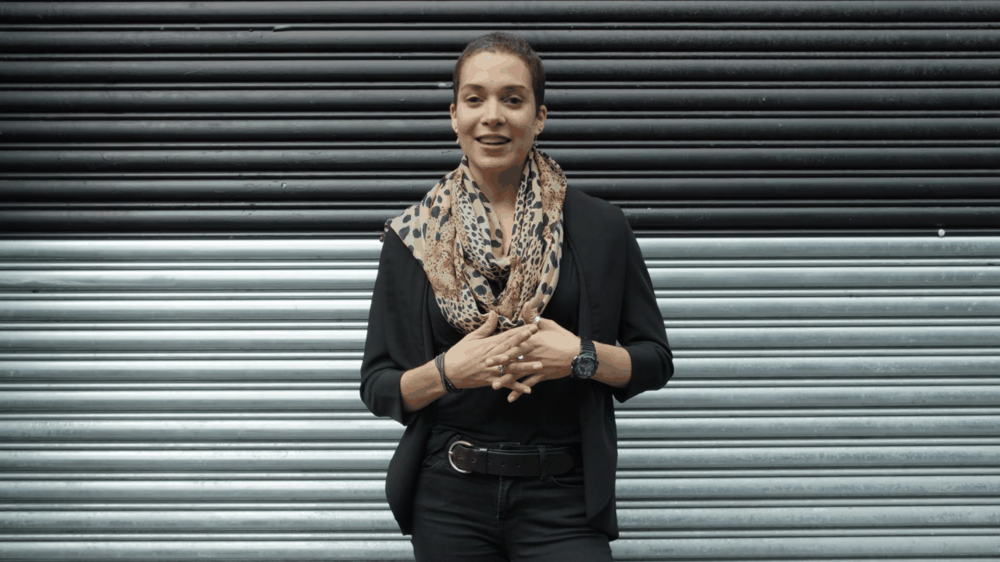

In [36]:
random_manip_video = manipulated_vid_w_path[random.randint(0, len(manipulated))]

print(random_manip_video)

random_manip_videos_frames = frames_from_video_file(random_manip_video, output_size = (720, 1280), n_frames = 10)

print(random_manip_videos_frames)

to_gif(random_manip_videos_frames)

In [37]:
video_frames = frames_from_video_file(train_files_path[0], 10) 
video_frames

array([[[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        ...,

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]],


       [[[0., 0., 0.],
         [0., 0., 0.],
         [0., 

In [38]:
class FrameGenerator:
  def __init__(self, path_list, class_list, n_frames, training = False):
    """ Returns a set of frames with their associated label. 

      Args:
        path: Video file paths.
        n_frames: Number of frames. 
        training: Boolean to determine if training dataset is being created.
    """
    self.path_list = path_list
    self.class_list = class_list
    self.n_frames = n_frames
    self.training = training
    self.class_names = set(('original', 'manipulated'))
    self.class_ids_for_name = dict((name, idx) for idx, name in enumerate(self.class_names))

  def get_files_and_class_names(self):
    video_paths = self.path_list
    classes = self.class_list
    return video_paths, classes

  def __call__(self):
    video_paths, classes = self.get_files_and_class_names()

    pairs = list(zip(video_paths, classes))

    if self.training:
      random.shuffle(pairs)

    for path, name in pairs:
      video_frames = frames_from_video_file(path, self.n_frames) 
      label = self.class_ids_for_name[name] # Encode labels
      yield video_frames, label

Shape: [[[[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  ...

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]]


 [[[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  ...

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ...
   [0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]]

  [[0. 0. 0.]
   [0. 0. 0.]
   [0. 0. 0.]
   ..


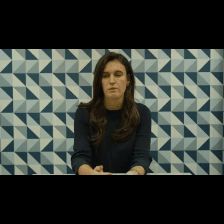

In [39]:
fg = FrameGenerator(train_files_path, train_classes, 10, training = True)

frames, label = next(fg())

print(f"Shape: {frames}")
print(f"Label: {label}")

to_gif(frames)

In [40]:
import tensorflow as tf
from tensorflow import keras
import keras.layers as layers

output_signature = (tf.TensorSpec(shape = (None, None, None, 3), dtype = tf.float32),
                    tf.TensorSpec(shape = (), dtype = tf.int16))

train_ds = tf.data.Dataset.from_generator(FrameGenerator(train_files_path, train_classes, 10, training = True),
                                          output_signature = output_signature)

test_ds = tf.data.Dataset.from_generator(FrameGenerator(test_files_path, test_classes, 10),
                                          output_signature = output_signature)

In [41]:
for frames, labels in train_ds.take(10):
  print(labels)

2023-05-03 23:18:58.024549: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


tf.Tensor(1, shape=(), dtype=int16)
tf.Tensor(0, shape=(), dtype=int16)
tf.Tensor(0, shape=(), dtype=int16)
tf.Tensor(0, shape=(), dtype=int16)
tf.Tensor(0, shape=(), dtype=int16)
tf.Tensor(1, shape=(), dtype=int16)
tf.Tensor(1, shape=(), dtype=int16)
tf.Tensor(1, shape=(), dtype=int16)
tf.Tensor(1, shape=(), dtype=int16)
tf.Tensor(0, shape=(), dtype=int16)


In [42]:
train_classes

['manipulated',
 'manipulated',
 'manipulated',
 'manipulated',
 'manipulated',
 'original',
 'original',
 'manipulated',
 'original',
 'manipulated',
 'original',
 'original',
 'manipulated',
 'manipulated',
 'original',
 'original',
 'manipulated',
 'original',
 'manipulated',
 'original',
 'manipulated',
 'original',
 'original',
 'manipulated',
 'manipulated',
 'original',
 'manipulated',
 'manipulated',
 'original',
 'manipulated',
 'original',
 'original',
 'original',
 'original',
 'original',
 'original',
 'original',
 'manipulated',
 'manipulated',
 'original',
 'manipulated',
 'manipulated',
 'original',
 'original',
 'manipulated',
 'original',
 'manipulated',
 'manipulated',
 'manipulated',
 'original',
 'original',
 'manipulated',
 'original',
 'manipulated',
 'manipulated',
 'manipulated',
 'manipulated',
 'original',
 'manipulated',
 'manipulated',
 'original',
 'manipulated',
 'manipulated',
 'manipulated',
 'original',
 'original',
 'manipulated',
 'manipulated',
 'ori

In [43]:
train_ds

<FlatMapDataset element_spec=(TensorSpec(shape=(None, None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int16, name=None))>

In [44]:
# AUTOTUNE = tf.data.AUTOTUNE

# train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = AUTOTUNE)
# test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size = AUTOTUNE)

In [45]:
train_ds = train_ds.batch(2).prefetch(1)
test_ds = test_ds.batch(2).prefetch(1)

In [46]:
train_frames, train_labels = next(iter(train_ds))
print(f'Shape of training set of frames: {train_frames.shape}')
print(f'Shape of training labels: {train_labels.shape}')


Shape of training set of frames: (2, 10, 224, 224, 3)
Shape of training labels: (2,)


In [47]:
test_frames, test_labels = next(iter(test_ds))
print(f'Shape of testing set of frames: {test_frames.shape}')
print(f'Shape of testing labels: {test_labels.shape}')

Shape of testing set of frames: (2, 10, 224, 224, 3)
Shape of testing labels: (2,)


In [48]:
image_shape = train_frames.shape

In [49]:
# def extract_video_frames(path):
#     for i in range(10):
#         sample_videos = []
#         print("Extracting frame from video", path[i], "-", i + 1, "of", len(path))
#         sample_videos.append(frames_from_video_file(path[i], n_frames = 5))    

#     return sample_videos
    

In [50]:
from tensorflow.python.client import device_lib
def get_available_devices():
    local_device_protos = device_lib.list_local_devices()
    return [x.name for x in local_device_protos]
print(get_available_devices())

import tensorflow as tf
print(tf.__version__)
print(tf.config.list_physical_devices())

['/device:CPU:0', '/device:GPU:0']
2.9.0
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [51]:
image_shape[1:]

TensorShape([10, 224, 224, 3])

In [52]:
batch_size = 64

cnn = keras.models.Sequential([
    keras.layers.Input(shape=image_shape[1:]),
    keras.layers.Rescaling(1./255),
    keras.layers.Conv3D(64, (3, 3, 3), activation='relu'),
    keras.layers.MaxPooling3D((2, 2, 2)),
    keras.layers.Flatten(),
    keras.layers.Dense(512, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

cnn.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [53]:
cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 10, 224, 224, 3)   0         
                                                                 
 conv3d (Conv3D)             (None, 8, 222, 222, 64)   5248      
                                                                 
 max_pooling3d (MaxPooling3D  (None, 4, 111, 111, 64)  0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 3154176)           0         
                                                                 
 dense (Dense)               (None, 512)               1614938624
                                                                 
 dense_1 (Dense)             (None, 1)                 513       
                                                        

In [54]:
with tf.device('/GPU:0'):
    history = cnn.fit(train_ds, 
          epochs = 10,
          validation_data = test_ds,
          steps_per_epoch = len(train) // 32)


Epoch 1/10
17/17 [==============================] - 103s 6s/step - loss: 0.6931 - accuracy: 0.5588 - val_loss: 0.6931 - val_accuracy: 0.5208
Epoch 2/10
17/17 [==============================] - 97s 6s/step - loss: 0.6931 - accuracy: 0.5882 - val_loss: 0.6931 - val_accuracy: 0.5208
Epoch 3/10
17/17 [==============================] - 98s 6s/step - loss: 0.6931 - accuracy: 0.5882 - val_loss: 0.6931 - val_accuracy: 0.5208
Epoch 4/10
17/17 [==============================] - 99s 6s/step - loss: 0.6931 - accuracy: 0.4412 - val_loss: 0.6931 - val_accuracy: 0.5208
Epoch 5/10
17/17 [==============================] - 98s 6s/step - loss: 0.6931 - accuracy: 0.4412 - val_loss: 0.6931 - val_accuracy: 0.5208
Epoch 6/10
17/17 [==============================] - 97s 6s/step - loss: 0.6931 - accuracy: 0.5588 - val_loss: 0.6931 - val_accuracy: 0.5208
Epoch 7/10
17/17 [==============================] - 93s 6s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5208
Epoch 8/10
17/17 [=

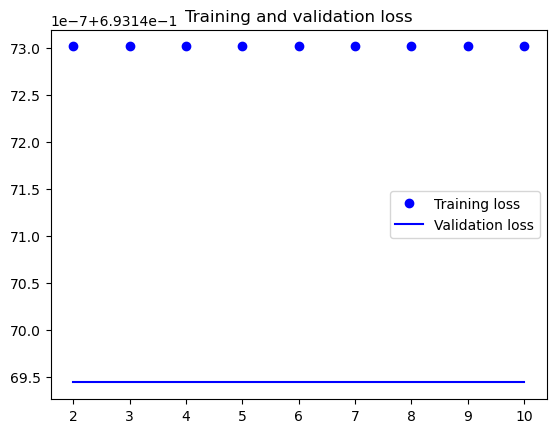

In [55]:
epochs = range(2, len(history.history["loss"]) + 1)
loss = history.history["loss"]
val_loss = history.history["val_loss"]
plt.figure()
plt.plot(epochs, loss[1:50], "bo", label="Training loss")
plt.plot(epochs, val_loss[1:50], "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()

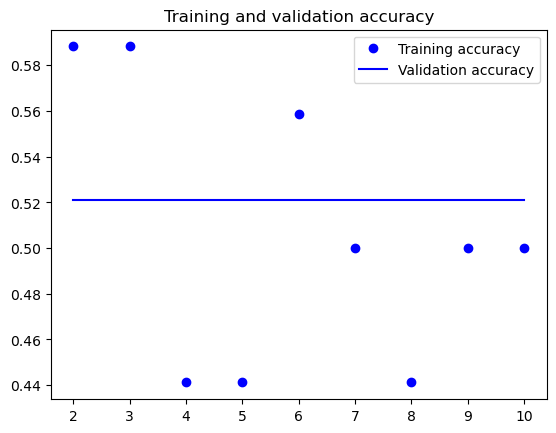

In [57]:
epochs = range(2, len(history.history["loss"]) + 1)
acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]
plt.figure()
plt.plot(epochs, acc[1:50], "bo", label="Training accuracy")
plt.plot(epochs, val_acc[1:50], "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()